In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
from dask.distributed import Client
import s1_rtc_bs_utils
import py3dep
import geopandas as gpd
import rasterio as rio
import pystac
import pystac_client
import stackstac
import math
import shapely
import matplotlib.pyplot as plt
import os
import xarray as xr

In [2]:
# GDAL environment variables for better performance
os.environ['AWS_REGION']='us-west-2'
os.environ['GDAL_DISABLE_READDIR_ON_OPEN']='EMPTY_DIR' 
os.environ['AWS_NO_SIGN_REQUEST']='YES' 
#
xr.set_options(keep_attrs=True)
# Paste /proxy/localhost:8787 for cluster diagnostics
client = Client(local_directory='/tmp', processes=False)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://172.25.45.79:8787/status,
Dashboard: http://172.25.45.79:8787/status,Workers: 1
Total threads: 32,Total memory: 125.71 GiB
Status: running,Using processes: False
Comm: inproc://172.25.45.79/591129/1,Workers: 1
Dashboard: http://172.25.45.79:8787/status,Total threads: 32
Started: Just now,Total memory: 125.71 GiB
Comm: inproc://172.25.45.79/591129/4,Total threads: 32
Dashboard: http://172.25.45.79:43209/status,Memory: 125.71 GiB
Nanny: None,


In [3]:
rainier_bbox_gdf = gpd.read_file('shapefiles/mt_rainier.geojson')

# Test get_s1_rtc_stac()

In [4]:
rainier_sar_ds=s1_rtc_bs_utils.get_s1_rtc_stac(rainier_bbox_gdf)

In [5]:
%%time
# compute frames, drop missing data
rainier_sar_ds = rainier_sar_ds.compute()
rainier_sar_ds = rainier_sar_ds.dropna('time',how='all')

CPU times: user 18.1 s, sys: 2.21 s, total: 20.3 s
Wall time: 13.8 s


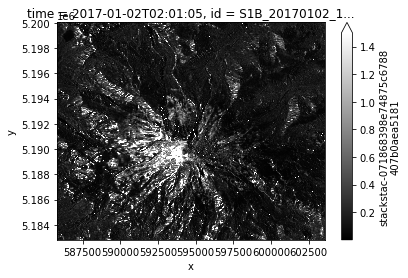

In [59]:
f,ax=plt.subplots()
rainier_sar_ds.isel(time=0).plot(ax=ax,vmax=1.5,cmap='gray')

# Test get_py3dep_dem(), get_py3dep_aspect(), get_py3dep_slope(), get_dah()

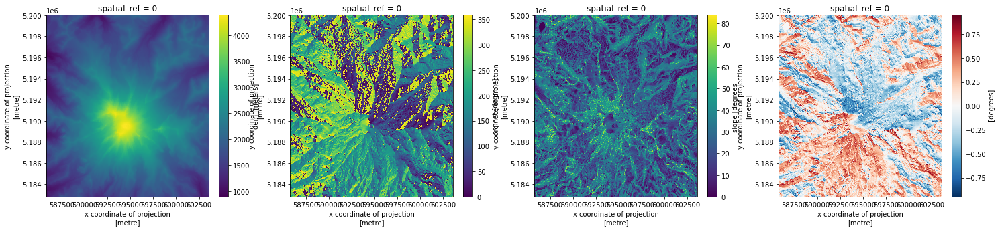

In [7]:
f,ax=plt.subplots(1,4,figsize=(25,5))
s1_rtc_bs_utils.get_py3dep_dem(rainier_sar_ds).plot(ax=ax[0])
s1_rtc_bs_utils.get_py3dep_aspect(rainier_sar_ds).plot(ax=ax[1])
s1_rtc_bs_utils.get_py3dep_slope(rainier_sar_ds).plot(ax=ax[2])
s1_rtc_bs_utils.get_dah(rainier_sar_ds).plot(ax=ax[3])

# Test get_median_ndvi()

In [8]:
dem = s1_rtc_bs_utils.get_py3dep_dem(rainier_sar_ds)
summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(rainier_sar_ds)

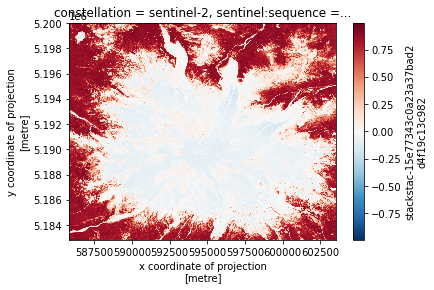

In [9]:
f,ax=plt.subplots()
summer_ndvi_ds.plot(ax=ax)

# Test plot_backscatter_ts_and_ndvi()

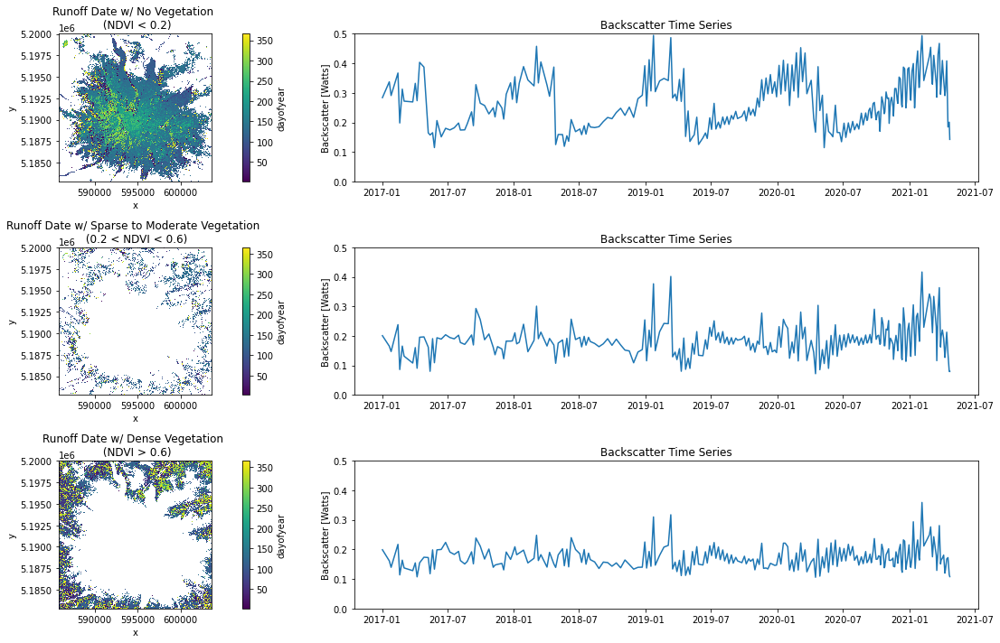

In [10]:
s1_rtc_bs_utils.plot_backscatter_ts_and_ndvi(rainier_sar_ds,summer_ndvi_ds)

# Test get_runoff_onset(), get_ripening_onset()

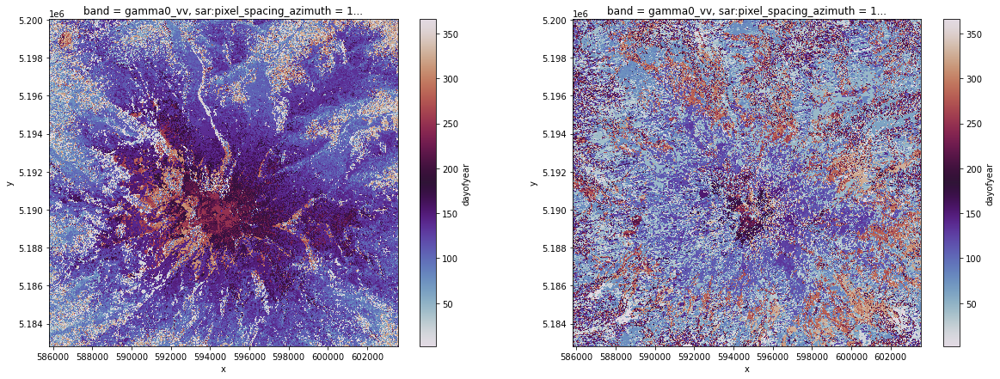

In [64]:
f,ax=plt.subplots(1,2,figsize=(20,7))
s1_rtc_bs_utils.get_runoff_onset(rainier_sar_ds).dt.dayofyear.plot(ax=ax[0],cmap='twilight')
s1_rtc_bs_utils.get_ripening_onset(rainier_sar_ds).dt.dayofyear.plot(ax=ax[1],cmap='twilight')

# Test get_stats()

In [47]:
stats_full_df = s1_rtc_bs_utils.get_stats(rainier_sar_ds)
stats_ndvi_mask_df = s1_rtc_bs_utils.get_stats(rainier_sar_ds.where(summer_ndvi_ds<0.2,drop=True))

rainier_glaciers = gpd.read_file('shapefiles/rainier_glaciers.geojson').to_crs(rainier_sar_ds.crs)
stats_glacier_mask_df = s1_rtc_bs_utils.get_stats(rainier_sar_ds.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False))

In [48]:
stats_full_df.corr()

,x,y,elevation,aspect,aspect_rescale,dah,runoff_dates,ripening_dates,runoff_prediction,ripening_prediction
x,1.000000,0.000102,0.084818,-0.244362,-0.022243,-0.093777,0.006061,0.077317,0.101764,0.099586
y,0.000102,1.000000,-0.186393,0.007062,0.311402,-0.234731,0.009724,-0.019220,-0.134018,0.220137
elevation,0.084818,-0.186393,1.000000,-0.072703,-0.014787,-0.020199,0.229783,0.009604,0.979127,0.093189
aspect,-0.244362,0.007062,-0.072703,1.000000,-0.017902,0.258516,0.030062,-0.141580,-0.123442,-0.262756
aspect_rescale,-0.022243,0.311402,-0.014787,-0.017902,1.000000,-0.852216,0.064667,0.042726,0.158831,0.847601
dah,-0.093777,-0.234731,-0.020199,0.258516,-0.852216,1.000000,-0.052331,-0.102781,-0.222987,-0.997328
runoff_dates,0.006061,0.009724,0.229783,0.030062,0.064667,-0.052331,1.000000,-0.007997,0.234682,0.068905
ripening_dates,0.077317,-0.019220,0.009604,-0.141580,0.042726,-0.102781,-0.007997,1.000000,0.030258,0.103057
runoff_prediction,0.101764,-0.134018,0.979127,-0.123442,0.158831,-0.222987,0.234682,0.030258,1.000000,0.293610
ripening_prediction,0.099586,0.220137,0.093189,-0.262756,0.847601,-0.997328,0.068905,0.103057,0.293610,1.000000


In [49]:
stats_ndvi_mask_df.corr()

,x,y,elevation,aspect,aspect_rescale,dah,runoff_dates,ripening_dates,runoff_prediction,ripening_prediction
x,1.000000,-0.093861,-0.053740,-0.304539,-0.011254,-0.122931,-0.077199,0.093143,-0.039522,0.131177
y,-0.093861,1.000000,-0.166681,-0.020926,0.492260,-0.377364,-0.034288,0.018078,-0.123032,0.403495
elevation,-0.053740,-0.166681,1.000000,-0.011124,-0.075605,0.042731,0.404050,-0.057073,0.993387,-0.515054
aspect,-0.304539,-0.020926,-0.011124,1.000000,-0.074700,0.308209,0.037392,-0.113482,-0.046524,-0.259103
aspect_rescale,-0.011254,0.492260,-0.075605,-0.074700,1.000000,-0.850041,0.042952,0.046867,0.022207,0.765454
dah,-0.122931,-0.377364,0.042731,0.308209,-0.850041,1.000000,-0.029390,-0.097333,-0.072258,-0.878383
runoff_dates,-0.077199,-0.034288,0.404050,0.037392,0.042952,-0.029390,1.000000,-0.047227,0.406740,-0.168080
ripening_dates,0.093143,0.018078,-0.057073,-0.113482,0.046867,-0.097333,-0.047227,1.000000,-0.045790,0.110809
runoff_prediction,-0.039522,-0.123032,0.993387,-0.046524,0.022207,-0.072258,0.406740,-0.045790,1.000000,-0.413237
ripening_prediction,0.131177,0.403495,-0.515054,-0.259103,0.765454,-0.878383,-0.168080,0.110809,-0.413237,1.000000


In [50]:
stats_glacier_mask_df.corr()

,x,y,elevation,aspect,aspect_rescale,dah,runoff_dates,ripening_dates,runoff_prediction,ripening_prediction
x,1.000000,-0.114185,0.008296,-0.474501,-0.011059,-0.189672,-0.067217,0.083506,0.017206,0.179450
y,-0.114185,1.000000,-0.209778,-0.040552,0.630434,-0.493604,-0.077425,0.076386,-0.186788,0.525399
elevation,0.008296,-0.209778,1.000000,-0.045860,-0.119764,0.041737,0.463519,-0.021461,0.998900,-0.292344
aspect,-0.474501,-0.040552,-0.045860,1.000000,-0.111255,0.355929,0.032131,-0.063354,-0.062606,-0.329102
aspect_rescale,-0.011059,0.630434,-0.119764,-0.111255,1.000000,-0.849050,-0.000651,0.046685,-0.080013,0.842894
dah,-0.189672,-0.493604,0.041737,0.355929,-0.849050,1.000000,-0.002397,-0.071036,-0.005166,-0.967682
runoff_dates,-0.067217,-0.077425,0.463519,0.032131,-0.000651,-0.002397,1.000000,-0.042296,0.464029,-0.114695
ripening_dates,0.083506,0.076386,-0.021461,-0.063354,0.046685,-0.071036,-0.042296,1.000000,-0.018145,0.073409
runoff_prediction,0.017206,-0.186788,0.998900,-0.062606,-0.080013,-0.005166,0.464029,-0.018145,1.000000,-0.247173
ripening_prediction,0.179450,0.525399,-0.292344,-0.329102,0.842894,-0.967682,-0.114695,0.073409,-0.247173,1.000000


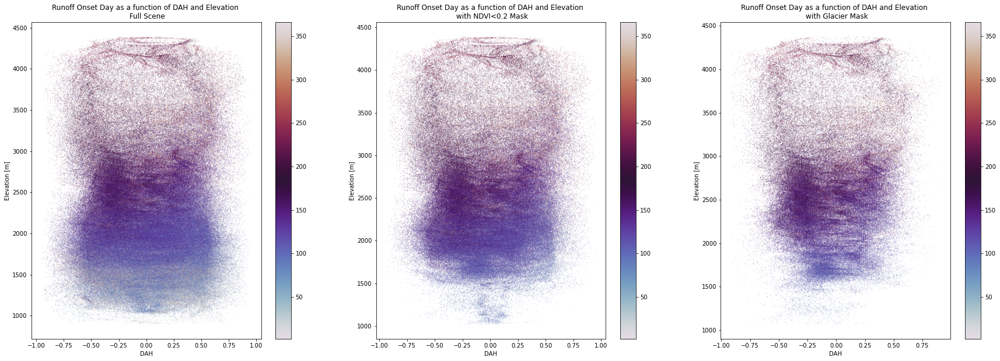

In [51]:
f,ax=plt.subplots(1,3,figsize=(30,10))
color1=ax[0].scatter(stats_full_df['dah'],stats_full_df['elevation'],c=stats_full_df['runoff_dates'],s=0.01,cmap='twilight')
color2=ax[1].scatter(stats_ndvi_mask_df['dah'],stats_ndvi_mask_df['elevation'],c=stats_ndvi_mask_df['runoff_dates'],s=0.01,cmap='twilight')
color3=ax[2].scatter(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'],c=stats_glacier_mask_df['runoff_dates'],s=0.01,cmap='twilight')

ax[0].set_title('Runoff Onset Day as a function of DAH and Elevation \n Full Scene')
ax[0].set_xlabel('DAH')
ax[0].set_ylabel('Elevation [m]')

ax[1].set_title('Runoff Onset Day as a function of DAH and Elevation \n with NDVI<0.2 Mask')
ax[1].set_xlabel('DAH')
ax[1].set_ylabel('Elevation [m]')

ax[2].set_title('Runoff Onset Day as a function of DAH and Elevation \n with Glacier Mask')
ax[2].set_xlabel('DAH')
ax[2].set_ylabel('Elevation [m]')

plt.colorbar(color1,ax=ax[0])
plt.colorbar(color2,ax=ax[1])
plt.colorbar(color3,ax=ax[2])

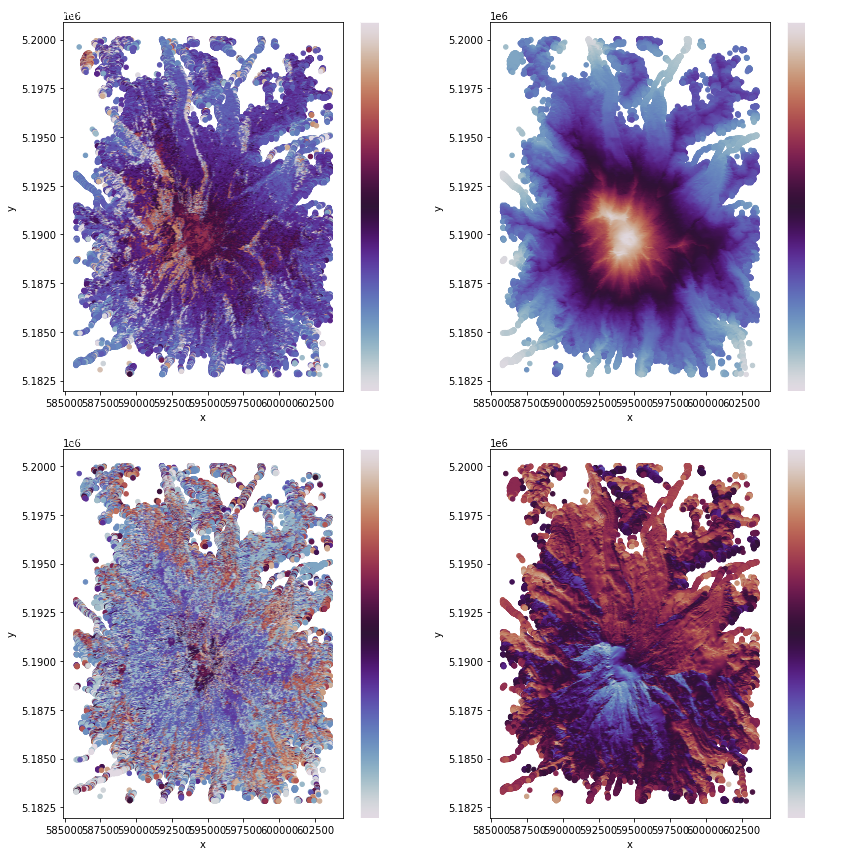

In [67]:
f,ax=plt.subplots(2,2,figsize=(12,12))

with plt.style.context('dark_background'):
    stats_df.plot.scatter(x='x',y='y',c='runoff_prediction',cmap='twilight',ax=ax[0,1])
    stats_df.plot.scatter(x='x',y='y',c='runoff_dates',cmap='twilight',ax=ax[0,0])
    ax[0,0].set_title('SAR Backscatter Derived DOY Runoff Onset Date',color='white')
    ax[0,1].set_title('MLS Predicted DOY Runoff Onset Date',color='white')
    stats_df.plot.scatter(x='x',y='y',c='ripening_prediction',cmap='twilight',ax=ax[1,1])
    stats_df.plot.scatter(x='x',y='y',c='ripening_dates',cmap='twilight',ax=ax[1,0])
    ax[1,0].set_title('SAR Backscatter Derived DOY Ripening Date',color='white')
    ax[1,1].set_title('MLS Predicted DOY Ripening Date',color='white')
    plt.tight_layout()

# Test plot_timeseries_by_elevation_bin(), plot_hyposometry()

In [35]:
resample_freq_s1='2W'
rainier_sar_2w_ds = rainier_sar_ds.where(summer_ndvi_ds.values<0.2).resample(time='2W').mean(dim='time')

Text(0.5, 0.98, 'Mt. Rainier Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each row: 2 week backscatter means for a given 100m elevation bin')

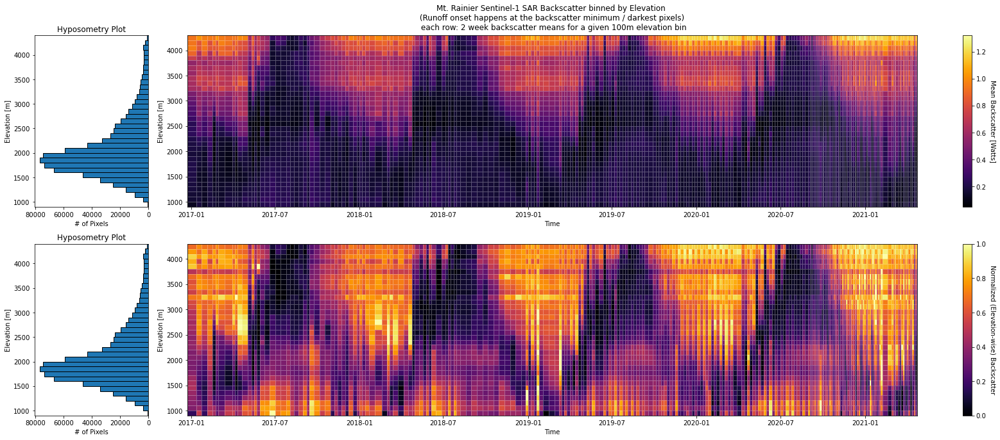

In [36]:
f,ax=plt.subplots(2,2,figsize=(24,10),gridspec_kw={'width_ratios': [1, 8]})
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(rainier_sar_ds,dem,bin_size=100,ax=ax[0,1],normalize_bins=False)
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(rainier_sar_ds,dem,bin_size=100,ax=ax[1,1],normalize_bins=True)
s1_rtc_bs_utils.plot_hyposometry(rainier_sar_ds,dem,bin_size=100,ax=ax[0,0])
s1_rtc_bs_utils.plot_hyposometry(rainier_sar_ds,dem,bin_size=100,ax=ax[1,0])
ax[0,0].invert_xaxis()
ax[1,0].invert_xaxis()
#plt.tight_layout()
f.tight_layout(rect=[0, 0.03, 1, 0.95])
f.suptitle("Mt. Rainier Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each row: 2 week backscatter means for a given 100m elevation bin")

Text(0.5, 0.98, 'Mt. Rainier Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each row: 2 week backscatter means for a given 100m elevation bin')

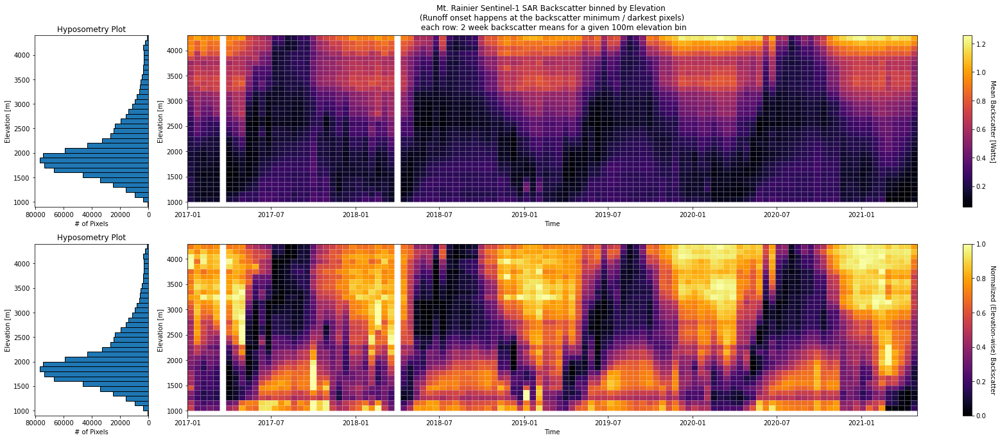

In [37]:
f,ax=plt.subplots(2,2,figsize=(24,10),gridspec_kw={'width_ratios': [1, 8]})
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(rainier_sar_2w_ds,dem,bin_size=100,ax=ax[0,1],normalize_bins=False)
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(rainier_sar_2w_ds,dem,bin_size=100,ax=ax[1,1],normalize_bins=True)
s1_rtc_bs_utils.plot_hyposometry(rainier_sar_2w_ds,dem,bin_size=100,ax=ax[0,0])
s1_rtc_bs_utils.plot_hyposometry(rainier_sar_2w_ds,dem,bin_size=100,ax=ax[1,0])
ax[0,0].invert_xaxis()
ax[1,0].invert_xaxis()
#plt.tight_layout()
f.tight_layout(rect=[0, 0.03, 1, 0.95])
f.suptitle("Mt. Rainier Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each row: 2 week backscatter means for a given 100m elevation bin")

In [38]:
# TODO .get_SNOTEL() .get_s2optical() .aggregate_by_time() .plot_gif() .plot_runoff() .plot_ripening()

In [ ]:
snotel = {'679_WA_SNTL': dict(longitude=-121.75, latitude=46.78, elevation=5130), # paradise ELEVATION IN FEET************
          '941_WA_SNTL': dict(longitude=-121.95, latitude=46.93, elevation=3160), # mowich
          '1085_WA_SNTL': dict(longitude=-121.53, latitude=46.87, elevation=5240) # cayuse pass
         }
df = gpd.pd.DataFrame(snotel).T

geometries = gpd.points_from_xy(df.longitude.values, df.latitude.values)

gf = gpd.GeoDataFrame(df, geometry=geometries, crs="EPSG:4326")

gf

import ulmo
from datetime import datetime

wsdlurl = 'https://hydroportal.cuahsi.org/Snotel/cuahsi_1_1.asmx?WSDL'
sitecode = 'SNOTEL:679_WA_SNTL'

ulmo.cuahsi.wof.get_site_info(wsdlurl, sitecode)['series'].keys()

variablecode_p = 'SNOTEL:TAVG_D'
#variablecode_p = 'SNOTEL:PRCPSA_D'
variablecode = 'SNOTEL:WTEQ_D'

# snow depth
# swe pillow better reading than ultrasonic
#Get current datetime
today = datetime.today().strftime('%Y-%m-%d')

def snotel_fetch(sitecode, variablecode='SNOTEL:SNWD_D', start_date='1950-10-01', end_date=today):
    #print(sitecode, variablecode, start_date, end_date)
    values_df = None
    try:
        #Request data from the server
        site_values = ulmo.cuahsi.wof.get_values(wsdlurl, sitecode, variablecode, start=start_date, end=end_date)
        #Convert to a Pandas DataFrame   
        values_df = pd.DataFrame.from_dict(site_values['values'])
        #Parse the datetime values to Pandas Timestamp objects
        values_df['datetime'] = pd.to_datetime(values_df['datetime'], utc=True)
        #Set the DataFrame index to the Timestamps
        values_df = values_df.set_index('datetime')
        #Convert values to float and replace -9999 nodata values with NaN
        values_df['value'] = pd.to_numeric(values_df['value']).replace(-9999, np.nan)
        #Remove any records flagged with lower quality
        values_df = values_df[values_df['quality_control_level_code'] == '1']
    except:
        print("Unable to fetch %s" % variablecode)

    return values_df

values_df = snotel_fetch(sitecode, variablecode, start_date, end_date)
values_df['value'] = 2.54*values_df['value']